In [1]:
import numpy as np
import pandas as pd

import os
import re
import ast
import math
import time
import nltk
import string
import unicodedata
import contractions
nltk.download('vader_lexicon')

from gensim.models import KeyedVectors
import gensim.downloader as api

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly.express as px
!pip install wordcloud

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from collections import Counter


from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import pairwise_distances


!pip install text_preprocessing
from text_preprocessing import preprocess_text
from text_preprocessing import to_lower, remove_email, remove_url, remove_punctuation
from nltk.tokenize import sent_tokenize,word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.sentiment import SentimentIntensityAnalyzer

from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

#Gensim
import gensim
import gensim.corpora as corpora
import gensim.downloader
from gensim.models import LdaModel
#spacy
!pip install spacy
import spacy
#vis
!pip install pyLDAvis
import pyLDAvis
import pyLDAvis.gensim_models

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\善予\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\善予\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


## 1. Refinement of text

In [2]:
tesco_df = pd.read_json('tesco.json')

In [3]:
tesco_df.columns.values

array(['created_at', 'id', 'id_str', 'text', 'display_text_range',
       'source', 'truncated', 'in_reply_to_status_id',
       'in_reply_to_status_id_str', 'in_reply_to_user_id',
       'in_reply_to_user_id_str', 'in_reply_to_screen_name', 'user',
       'geo', 'coordinates', 'place', 'contributors', 'is_quote_status',
       'quote_count', 'reply_count', 'retweet_count', 'favorite_count',
       'entities', 'favorited', 'retweeted', 'filter_level', 'lang',
       'matching_rules', 'possibly_sensitive', 'extended_tweet',
       'retweeted_status', 'quoted_status_id', 'quoted_status_id_str',
       'quoted_status', 'quoted_status_permalink', 'extended_entities',
       'scopes'], dtype=object)

In [4]:
tesco_df['extended_tweet'].head()

0                                                 None
1                                                 None
2    {'full_text': 'WHO WILL WIN?
@researchlive UK ...
3                                                 None
4                                                 None
Name: extended_tweet, dtype: object

In [5]:
tesco_df['extended_tweet'] = tesco_df['extended_tweet'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

tesco_df['full_text'] = [x['full_text'] if x!=None else None for x in tesco_df['extended_tweet']]

tesco_df['full_text'] = [y if x==None else x for x,y in zip(tesco_df['full_text'],tesco_df['text'])]

pd.set_option('display.max_colwidth', None)
tesco_df['full_text'].head(10)

0                                                                                                                                                                                                                                                                  @JourneyStoma @Tesco That’s awesome! I want one too!
1                                                                                                                                                                                                                                                                      @Tesco Thanks Ben, you're doing a great job ☺️♥️
2    WHO WILL WIN?\n@researchlive UK Business Impact of the Year, sponsored by @TheMarketingSoc:\n⭐️ @FA\n⭐️ @networkrail &amp; @YonderConsult\n⭐️ @Sparkler3D &amp; @TwitterUK\n⭐️ @ResearchBods &amp; @asda\n⭐️ @Tesco &amp; @CSpaceGlobal\n⭐️ @VodafoneUK &amp; @TruthConsulting\n#MRSawards https://t.co/PDW6xs9UD1
3                                                               

## 2. Select necessary columns

In [6]:
tesco_df = tesco_df[['created_at', 'full_text','source', 'entities', 'lang']].copy()
tesco_df.head(10)

,created_at,full_text,source,entities,lang
0,2020-10-09 12:46:48,@JourneyStoma @Tesco That’s awesome! I want one too!,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'JourneyStoma', 'name': 'jessicas stoma journey', 'id': 1232802964970131456, 'id_str': '1232802964970131456', 'indices': [0, 13]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [14, 20]}], 'symbols': []}",en
1,2020-04-21 13:03:54,"@Tesco Thanks Ben, you're doing a great job ☺️♥️","<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [0, 6]}], 'symbols': []}",en
2,2020-11-30 12:26:19,"WHO WILL WIN?\n@researchlive UK Business Impact of the Year, sponsored by @TheMarketingSoc:\n⭐️ @FA\n⭐️ @networkrail &amp; @YonderConsult\n⭐️ @Sparkler3D &amp; @TwitterUK\n⭐️ @ResearchBods &amp; @asda\n⭐️ @Tesco &amp; @CSpaceGlobal\n⭐️ @VodafoneUK &amp; @TruthConsulting\n#MRSawards https://t.co/PDW6xs9UD1","<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>","{'hashtags': [], 'urls': [{'url': 'https://t.co/mHqf6Urrwd', 'expanded_url': 'https://twitter.com/i/web/status/1333386877974556673', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [121, 144]}], 'user_mentions': [{'screen_name': 'researchlive', 'name': 'Research-live.com', 'id': 15748899, 'id_str': '15748899', 'indices': [14, 27]}, {'screen_name': 'TheMarketingSoc', 'name': 'Marketing Society', 'id': 31104510, 'id_str': '31104510', 'indices': [73, 89]}, {'screen_name': 'FA', 'name': 'The FA', 'id': 1111325148064428033, 'id_str': '1111325148064428033', 'indices': [94, 97]}, {'screen_name': 'networkrail', 'name': 'Network Rail', 'id': 365344176, 'id_str': '365344176', 'indices': [101, 113]}], 'symbols': []}",en
3,2020-04-16 19:07:30,@Cilvrnum @Tesco @asda @Ocado Never even seen or heard of this,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'Cilvrnum', 'name': 'JanetM', 'id': 597424425, 'id_str': '597424425', 'indices': [0, 9]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [10, 16]}, {'screen_name': 'asda', 'name': 'Asda', 'id': 20123366, 'id_str': '20123366', 'indices': [17, 22]}, {'screen_name': 'Ocado', 'name': 'ocado', 'id': 20155502, 'id_str': '20155502', 'indices': [23, 29]}], 'symbols': []}",en
4,2020-12-22 11:34:32,Any comment @Tesco ? British carrots proudly displaying the union flag grown in Spain? #Fraudulent https://t.co/miwKoWY6pc,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [{'text': 'Fraudulent', 'indices': [87, 98]}], 'urls': [], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [12, 18]}], 'symbols': [], 'media': [{'id': 1341346375934611461, 'id_str': '1341346375934611461', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'url': 'https://t.co/miwKoWY6pc', 'display_url': 'pic.twitter.com/miwKoWY6pc', 'expanded_url': 'https://twitter.com/AndyEastAnglia/status/1341346379478740993/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'large': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'small': {'w': 382, 'h': 680, 'resize': 'fit'}}}]}",en
5,2020-02-09 20:00:59,"RT @HardyCaprio: It’s hard to say racism isn’t dead when @Tesco staff told me, after showing them ID, that they didn’t feel comfortable sel…","<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>","{'hashtags': [], 'urls': [], 'user_

In [7]:
# tesco_df = tesco_df.sort_values(by='created_at')
# tesco_df = tesco_df.reset_index(drop=True)
# tesco_df.head()

## 3. Only analysis English text data

In [8]:
lang_counts = tesco_df['lang'].value_counts()
lang_counts.head()

lang
en     92732
und     3018
es       158
in       102
tl        88
Name: count, dtype: int64

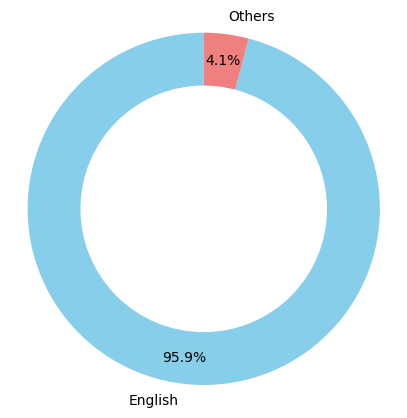

In [9]:
lang_groups = {
    'en': 'English',  
}

lang_counts_grouped = lang_counts.groupby(lambda x: lang_groups.get(x, 'Others')).sum()

# pie chart
plt.figure(figsize=(5, 5))
plt.pie(
    lang_counts_grouped,  
    labels=lang_counts_grouped.index,  
    autopct='%1.1f%%',  
    startangle=90,  
    colors=['skyblue', 'lightcoral'],  
    pctdistance=0.85 
)


centre_circle = plt.Circle((0, 0), 0.70, fc='white')
plt.gca().add_artist(centre_circle)

plt.axis('equal')  
plt.show()

In [10]:
tesco_df = tesco_df[tesco_df['lang'] == 'en']

In [11]:
num_rows = len(tesco_df)
num_rows

92732

# 4.Text Preprocessing

In [12]:
# remove @
pattern = re.compile(r'@\w+\s*')

def remove_mentions(text):
    return pattern.sub('', text)

tesco_df['full_text'] = tesco_df['full_text'].apply(remove_mentions)
tesco_df.head()

,created_at,full_text,source,entities,lang
0,2020-10-09 12:46:48,That’s awesome! I want one too!,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'JourneyStoma', 'name': 'jessicas stoma journey', 'id': 1232802964970131456, 'id_str': '1232802964970131456', 'indices': [0, 13]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [14, 20]}], 'symbols': []}",en
1,2020-04-21 13:03:54,"Thanks Ben, you're doing a great job ☺️♥️","<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [0, 6]}], 'symbols': []}",en
2,2020-11-30 12:26:19,"WHO WILL WIN?\nUK Business Impact of the Year, sponsored by :\n⭐️ ⭐️ &amp; ⭐️ &amp; ⭐️ &amp; ⭐️ &amp; ⭐️ &amp; #MRSawards https://t.co/PDW6xs9UD1","<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>","{'hashtags': [], 'urls': [{'url': 'https://t.co/mHqf6Urrwd', 'expanded_url': 'https://twitter.com/i/web/status/1333386877974556673', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [121, 144]}], 'user_mentions': [{'screen_name': 'researchlive', 'name': 'Research-live.com', 'id': 15748899, 'id_str': '15748899', 'indices': [14, 27]}, {'screen_name': 'TheMarketingSoc', 'name': 'Marketing Society', 'id': 31104510, 'id_str': '31104510', 'indices': [73, 89]}, {'screen_name': 'FA', 'name': 'The FA', 'id': 1111325148064428033, 'id_str': '1111325148064428033', 'indices': [94, 97]}, {'screen_name': 'networkrail', 'name': 'Network Rail', 'id': 365344176, 'id_str': '365344176', 'indices': [101, 113]}], 'symbols': []}",en
3,2020-04-16 19:07:30,Never even seen or heard of this,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'Cilvrnum', 'name': 'JanetM', 'id': 597424425, 'id_str': '597424425', 'indices': [0, 9]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [10, 16]}, {'screen_name': 'asda', 'name': 'Asda', 'id': 20123366, 'id_str': '20123366', 'indices': [17, 22]}, {'screen_name': 'Ocado', 'name': 'ocado', 'id': 20155502, 'id_str': '20155502', 'indices': [23, 29]}], 'symbols': []}",en
4,2020-12-22 11:34:32,Any comment ? British carrots proudly displaying the union flag grown in Spain? #Fraudulent https://t.co/miwKoWY6pc,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [{'text': 'Fraudulent', 'indices': [87, 98]}], 'urls': [], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [12, 18]}], 'symbols': [], 'media': [{'id': 1341346375934611461, 'id_str': '1341346375934611461', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'url': 'https://t.co/miwKoWY6pc', 'display_url': 'pic.twitter.com/miwKoWY6pc', 'expanded_url': 'https://twitter.com/AndyEastAnglia/status/1341346379478740993/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'large': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'small': {'w': 382, 'h': 680, 'resize': 'fit'}}}]}",en


In [13]:
stop_words = stopwords.words('english')
new_stopwords = ['rt', 'hey', 'will', 'now','one','wa','get','store','supermarket','i','me','my','myself','ive','im','we','our','ours','ourselves',
                'you','youre','youve','youll','youd','your']
stop_words.extend(new_stopwords)
def cleaning_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in stop_words])

def remove_characters(text):
    return re.sub(r'[^a-zA-Z0-9\s]', '', text)

def remove_special_characters(text):
    return re.sub(r'[^\x00-\x7F]+', '', text)

def to_lower(text):
    return text.lower()

def remove_punctuation(text):
    return re.sub(r'[^\w\s]', '', text)

def remove_numbers(text):
    return re.sub(r'[0-9]', '', text)

def remove_email(text):
    return re.sub(r'\b[A-Za-z0-9._%+-]+@[A-Za-z0-9.-]+\.[A-Z|a-z]{2,}\b', '', text)

def remove_url(text):
    return re.sub(r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\'(),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', '', text)

tesco_df['full_text'] = tesco_df['full_text'].apply(to_lower)
tesco_df['full_text'] = tesco_df['full_text'].apply(remove_url)
tesco_df['full_text'] = tesco_df['full_text'].apply(remove_punctuation)
tesco_df['full_text'] = tesco_df['full_text'].apply(remove_numbers)
tesco_df['full_text'] = tesco_df['full_text'].apply(remove_email)
tesco_df['full_text'] = tesco_df['full_text'].apply(remove_characters)
tesco_df['full_text'] = tesco_df['full_text'].apply(remove_special_characters)
tesco_df['full_text'] = tesco_df['full_text'].apply(lambda text: cleaning_stopwords(text))

tesco_df.head(10)

,created_at,full_text,source,entities,lang
0,2020-10-09 12:46:48,thats awesome want,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'JourneyStoma', 'name': 'jessicas stoma journey', 'id': 1232802964970131456, 'id_str': '1232802964970131456', 'indices': [0, 13]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [14, 20]}], 'symbols': []}",en
1,2020-04-21 13:03:54,thanks ben great job,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [0, 6]}], 'symbols': []}",en
2,2020-11-30 12:26:19,win uk business impact year sponsored amp amp amp amp amp mrsawards,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>","{'hashtags': [], 'urls': [{'url': 'https://t.co/mHqf6Urrwd', 'expanded_url': 'https://twitter.com/i/web/status/1333386877974556673', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [121, 144]}], 'user_mentions': [{'screen_name': 'researchlive', 'name': 'Research-live.com', 'id': 15748899, 'id_str': '15748899', 'indices': [14, 27]}, {'screen_name': 'TheMarketingSoc', 'name': 'Marketing Society', 'id': 31104510, 'id_str': '31104510', 'indices': [73, 89]}, {'screen_name': 'FA', 'name': 'The FA', 'id': 1111325148064428033, 'id_str': '1111325148064428033', 'indices': [94, 97]}, {'screen_name': 'networkrail', 'name': 'Network Rail', 'id': 365344176, 'id_str': '365344176', 'indices': [101, 113]}], 'symbols': []}",en
3,2020-04-16 19:07:30,never even seen heard,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'Cilvrnum', 'name': 'JanetM', 'id': 597424425, 'id_str': '597424425', 'indices': [0, 9]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [10, 16]}, {'screen_name': 'asda', 'name': 'Asda', 'id': 20123366, 'id_str': '20123366', 'indices': [17, 22]}, {'screen_name': 'Ocado', 'name': 'ocado', 'id': 20155502, 'id_str': '20155502', 'indices': [23, 29]}], 'symbols': []}",en
4,2020-12-22 11:34:32,comment british carrots proudly displaying union flag grown spain fraudulent,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [{'text': 'Fraudulent', 'indices': [87, 98]}], 'urls': [], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [12, 18]}], 'symbols': [], 'media': [{'id': 1341346375934611461, 'id_str': '1341346375934611461', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'url': 'https://t.co/miwKoWY6pc', 'display_url': 'pic.twitter.com/miwKoWY6pc', 'expanded_url': 'https://twitter.com/AndyEastAnglia/status/1341346379478740993/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'large': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'small': {'w': 382, 'h': 680, 'resize': 'fit'}}}]}",en
5,2020-02-09 20:00:59,hard say racism isnt dead staff told showing id didnt feel comfortable sel,"<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'HardyCaprio', 'name': 'hardy caprio', 'id': 170423348, 'id_str': '170423348', 'indices': [3, 15]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [57, 63]}], 'symbols': []}",en
6,2020-06-09 12:47:00,weaning week awards winner best retailer wins gold wins silver win joint bronze congratulations awardswinner weaningweekawards,"<a href=""https://about.twitter.com/products/tweetdeck"" r

# 5. Lemmatization 

In [14]:
lemmatizer = WordNetLemmatizer()

def lemmatize_text(text):
    return ' '.join([lemmatizer.lemmatize(word) for word in text.split()])

tesco_df['full_text'] = tesco_df['full_text'].apply(lemmatize_text)

tesco_df.head(2)

,created_at,full_text,source,entities,lang
0,2020-10-09 12:46:48,thats awesome want,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'JourneyStoma', 'name': 'jessicas stoma journey', 'id': 1232802964970131456, 'id_str': '1232802964970131456', 'indices': [0, 13]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [14, 20]}], 'symbols': []}",en
1,2020-04-21 13:03:54,thanks ben great job,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [0, 6]}], 'symbols': []}",en


In [15]:
# count words
tesco_df['word_count'] = tesco_df['full_text'].apply(lambda x: len(x.split()))
tesco_df.head(15)

,created_at,full_text,source,entities,lang,word_count
0,2020-10-09 12:46:48,thats awesome want,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'JourneyStoma', 'name': 'jessicas stoma journey', 'id': 1232802964970131456, 'id_str': '1232802964970131456', 'indices': [0, 13]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [14, 20]}], 'symbols': []}",en,3
1,2020-04-21 13:03:54,thanks ben great job,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [0, 6]}], 'symbols': []}",en,4
2,2020-11-30 12:26:19,win uk business impact year sponsored amp amp amp amp amp mrsawards,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>","{'hashtags': [], 'urls': [{'url': 'https://t.co/mHqf6Urrwd', 'expanded_url': 'https://twitter.com/i/web/status/1333386877974556673', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [121, 144]}], 'user_mentions': [{'screen_name': 'researchlive', 'name': 'Research-live.com', 'id': 15748899, 'id_str': '15748899', 'indices': [14, 27]}, {'screen_name': 'TheMarketingSoc', 'name': 'Marketing Society', 'id': 31104510, 'id_str': '31104510', 'indices': [73, 89]}, {'screen_name': 'FA', 'name': 'The FA', 'id': 1111325148064428033, 'id_str': '1111325148064428033', 'indices': [94, 97]}, {'screen_name': 'networkrail', 'name': 'Network Rail', 'id': 365344176, 'id_str': '365344176', 'indices': [101, 113]}], 'symbols': []}",en,12
3,2020-04-16 19:07:30,never even seen heard,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'Cilvrnum', 'name': 'JanetM', 'id': 597424425, 'id_str': '597424425', 'indices': [0, 9]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [10, 16]}, {'screen_name': 'asda', 'name': 'Asda', 'id': 20123366, 'id_str': '20123366', 'indices': [17, 22]}, {'screen_name': 'Ocado', 'name': 'ocado', 'id': 20155502, 'id_str': '20155502', 'indices': [23, 29]}], 'symbols': []}",en,4
4,2020-12-22 11:34:32,comment british carrot proudly displaying union flag grown spain fraudulent,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [{'text': 'Fraudulent', 'indices': [87, 98]}], 'urls': [], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [12, 18]}], 'symbols': [], 'media': [{'id': 1341346375934611461, 'id_str': '1341346375934611461', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'url': 'https://t.co/miwKoWY6pc', 'display_url': 'pic.twitter.com/miwKoWY6pc', 'expanded_url': 'https://twitter.com/AndyEastAnglia/status/1341346379478740993/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'large': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'small': {'w': 382, 'h': 680, 'resize': 'fit'}}}]}",en,10
5,2020-02-09 20:00:59,hard say racism isnt dead staff told showing id didnt feel comfortable sel,"<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'HardyCaprio', 'name': 'hardy caprio', 'id': 170423348, 'id_str': '170423348', 'indices': [3, 15]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [57, 63]}], 'symbols': []}",en,13
6,2020-06-09 12:47:00,weaning week award winner best retailer win gold win silver win joint bronze congratulation awardswinner weaningweekawards,"<a href=""https://about.twitter.com/p

analysis the number of words

In [16]:
tesco_df['word_count'].describe()

count    92732.000000
mean        10.722771
std          6.416227
min          0.000000
25%          6.000000
50%         10.000000
75%         14.000000
max         37.000000
Name: word_count, dtype: float64

In [17]:
threshold = 6
tesco_df = tesco_df[tesco_df['word_count'] >= threshold]
tesco_df.head()

,created_at,full_text,source,entities,lang,word_count
2,2020-11-30 12:26:19,win uk business impact year sponsored amp amp amp amp amp mrsawards,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>","{'hashtags': [], 'urls': [{'url': 'https://t.co/mHqf6Urrwd', 'expanded_url': 'https://twitter.com/i/web/status/1333386877974556673', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [121, 144]}], 'user_mentions': [{'screen_name': 'researchlive', 'name': 'Research-live.com', 'id': 15748899, 'id_str': '15748899', 'indices': [14, 27]}, {'screen_name': 'TheMarketingSoc', 'name': 'Marketing Society', 'id': 31104510, 'id_str': '31104510', 'indices': [73, 89]}, {'screen_name': 'FA', 'name': 'The FA', 'id': 1111325148064428033, 'id_str': '1111325148064428033', 'indices': [94, 97]}, {'screen_name': 'networkrail', 'name': 'Network Rail', 'id': 365344176, 'id_str': '365344176', 'indices': [101, 113]}], 'symbols': []}",en,12
4,2020-12-22 11:34:32,comment british carrot proudly displaying union flag grown spain fraudulent,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [{'text': 'Fraudulent', 'indices': [87, 98]}], 'urls': [], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [12, 18]}], 'symbols': [], 'media': [{'id': 1341346375934611461, 'id_str': '1341346375934611461', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'url': 'https://t.co/miwKoWY6pc', 'display_url': 'pic.twitter.com/miwKoWY6pc', 'expanded_url': 'https://twitter.com/AndyEastAnglia/status/1341346379478740993/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'large': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'small': {'w': 382, 'h': 680, 'resize': 'fit'}}}]}",en,10
5,2020-02-09 20:00:59,hard say racism isnt dead staff told showing id didnt feel comfortable sel,"<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'HardyCaprio', 'name': 'hardy caprio', 'id': 170423348, 'id_str': '170423348', 'indices': [3, 15]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [57, 63]}], 'symbols': []}",en,13
6,2020-06-09 12:47:00,weaning week award winner best retailer win gold win silver win joint bronze congratulation awardswinner weaningweekawards,"<a href=""https://about.twitter.com/products/tweetdeck"" rel=""nofollow"">TweetDeck</a>","{'hashtags': [], 'urls': [{'url': 'https://t.co/63oSiGtjiQ', 'expanded_url': 'https://twitter.com/i/web/status/1270336593421721600', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [112, 135]}], 'user_mentions': [{'screen_name': 'AmazonUK', 'name': 'Amazon.co.uk', 'id': 209004862, 'id_str': '209004862', 'indices': [56, 65]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [78, 84]}, {'screen_name': 'LidlGB', 'name': '@LidlGB', 'id': 340234449, 'id_str': '340234449', 'indices': [99, 106]}], 'symbols': []}",en,16
7,2020-05-19 16:04:33,umm bought jam filled doughnut eating realised zero jam like empty doughnut ask fuck,"<a href=""http://twitter.com/#!/download/ipad"" rel=""nofollow"">Twitter for iPad</a>","{'hashtags': [], 'urls': [{'url': 'https://t.co/XyuGui28He', 'expanded_url': 'https://twitter.com/i/web/status/1262776164717903874', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [117, 140]}], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [5, 11]}], 'symbols': []}",en,14


In [18]:
num_rows = len(tesco_df)
num_rows

72048

## 6. LDA topic modelling

In [19]:
tesco_df['full_text'].isnull().sum()

0

In [20]:
def generate_tokens(tweet):
    words=[]
    for word in tweet.split(' '):
        if word != '' and word not in stop_words:
           words.append(word)
    return words

#storing the generated tokens in a new column named 'tokens'
tesco_df['tokens']=tesco_df.full_text.apply(generate_tokens)

In [21]:
def create_dictionary(words):
    return corpora.Dictionary(words)
id2word=create_dictionary(tesco_df['tokens'])
print(id2word)

Dictionary<35239 unique tokens: ['amp', 'business', 'impact', 'mrsawards', 'sponsored']...>


In [22]:
tesco_df.reset_index(drop=True, inplace=True)

In [23]:
def create_document_matrix(tokens,id2word):
    corpus = []
    for text in tokens:
        corpus.append(id2word.doc2bow(text))
    return corpus
#passing the dataframe column having tokens and dictionary
corpus=create_document_matrix(tesco_df['tokens'],id2word)
print(tesco_df['tokens'][0])
print(corpus[0])

['win', 'uk', 'business', 'impact', 'year', 'sponsored', 'amp', 'amp', 'amp', 'amp', 'amp', 'mrsawards']
[(0, 5), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1)]


In [24]:
from gensim.models import CoherenceModel
num_topics_range = [2, 3, 4, 5, 6, 7, 8, 9, 10]

lda_models = {}
coherence_scores = {}

# calculate Topic Coherence Score
for num_topics in num_topics_range:
    # create LDA top modelling
    lda_model = gensim.models.LdaModel(
        corpus=corpus,
        id2word=id2word,
        num_topics=num_topics,
        random_state=42,
        passes=10,
        alpha='auto',
        per_word_topics=True
    )

    coherence_model = CoherenceModel(
        model=lda_model,
        texts=tesco_df['tokens'],  
        dictionary=id2word,
        coherence='c_v'  
    )

    coherence_score = coherence_model.get_coherence()

    lda_models[num_topics] = lda_model
    coherence_scores[num_topics] = coherence_score

In [25]:
# Find the number of topics with the highest coherence score
best_num_topics = max(coherence_scores, key=coherence_scores.get)

print(f"the number of best topics: {best_num_topics}")
print(f"Topic Coherence: {coherence_scores[best_num_topics]}")

# obtain the optimal LDA model
best_lda_model = lda_models[best_num_topics]

for idx, topic in enumerate(best_lda_model.print_topics(-1)):
    print(f"topic {idx + 1}: {topic}")

the number of best topics: 10
Topic Coherence: 0.38066942717142566
topic 1: (0, '0.078*"hour" + 0.040*"sunday" + 0.037*"th" + 0.030*"first" + 0.029*"guy" + 0.027*"opening" + 0.025*"idea" + 0.024*"brilliant" + 0.024*"tesco" + 0.024*"express"')
topic 2: (1, '0.034*"people" + 0.025*"dont" + 0.025*"would" + 0.022*"like" + 0.020*"make" + 0.018*"know" + 0.015*"think" + 0.014*"thats" + 0.013*"need" + 0.012*"thing"')
topic 3: (2, '0.044*"amp" + 0.036*"open" + 0.036*"stock" + 0.025*"high" + 0.025*"uk" + 0.023*"food" + 0.022*"chicken" + 0.020*"letter" + 0.019*"sign" + 0.019*"protect"')
topic 4: (3, '0.047*"vegetable" + 0.047*"time" + 0.045*"favourite" + 0.045*"cook" + 0.045*"surprise" + 0.044*"fo" + 0.044*"broccoli" + 0.043*"unwrapping" + 0.039*"pm" + 0.036*"tweet"')
topic 5: (4, '0.039*"best" + 0.031*"always" + 0.031*"able" + 0.029*"ever" + 0.024*"son" + 0.022*"despite" + 0.021*"wow" + 0.020*"effort" + 0.019*"alex" + 0.017*"compared"')
topic 6: (5, '0.027*"social" + 0.025*"ok" + 0.021*"distanci

In [26]:
# Add a mapping dictionary with custom names for themes
topic_names = {
    3: "Food",  
    6: "Packaging",  
    8: "Customer Service",
    9: "Online Shopping"  
}

lda_topics = {
    3: '0.047*"vegetable" + 0.047*"time" + 0.045*"favourite" + 0.045*"cook" + 0.045*"surprise" + 0.044*"fo" + 0.044*"broccoli" + 0.043*"unwrapping" + 0.039*"pm" + 0.036*"tweet"',
    6: '0.025*"plastic" + 0.025*"sprout" + 0.024*"mean" + 0.020*"instead" + 0.019*"product" + 0.018*"please" + 0.017*"pack" + 0.015*"bag" + 0.014*"cleaner" + 0.012*"thousand"',
    8: '0.027*"tesco" + 0.021*"staff" + 0.015*"u" + 0.014*"customer" + 0.012*"time" + 0.012*"thank" + 0.011*"thanks" + 0.011*"amp" + 0.011*"well" + 0.010*"please"',
    9: '0.034*"delivery" + 0.024*"food" + 0.020*"slot" + 0.018*"cant" + 0.017*"week" + 0.017*"shop" + 0.015*"shopping" + 0.013*"vulnerable" + 0.013*"order" + 0.012*"online"'
}


for index, terms in lda_topics.items():
    theme_name = topic_names.get(index, f"Topic {index + 1}")
    print(f"{theme_name}: {terms}")

Food: 0.047*"vegetable" + 0.047*"time" + 0.045*"favourite" + 0.045*"cook" + 0.045*"surprise" + 0.044*"fo" + 0.044*"broccoli" + 0.043*"unwrapping" + 0.039*"pm" + 0.036*"tweet"
Packaging: 0.025*"plastic" + 0.025*"sprout" + 0.024*"mean" + 0.020*"instead" + 0.019*"product" + 0.018*"please" + 0.017*"pack" + 0.015*"bag" + 0.014*"cleaner" + 0.012*"thousand"
Customer Service: 0.027*"tesco" + 0.021*"staff" + 0.015*"u" + 0.014*"customer" + 0.012*"time" + 0.012*"thank" + 0.011*"thanks" + 0.011*"amp" + 0.011*"well" + 0.010*"please"
Online Shopping: 0.034*"delivery" + 0.024*"food" + 0.020*"slot" + 0.018*"cant" + 0.017*"week" + 0.017*"shop" + 0.015*"shopping" + 0.013*"vulnerable" + 0.013*"order" + 0.012*"online"


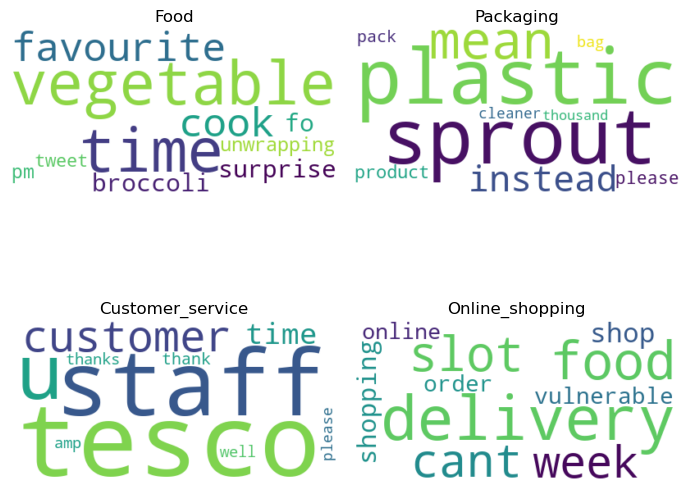

In [27]:
# Generate word cloud
topic_terms = {
    "Food": {
        "vegetable": 0.047,
        "time": 0.047,
        "favourite": 0.045,
        "cook": 0.045,
        "surprise": 0.045,
        "fo": 0.044,
        "broccoli": 0.044,
        "unwrapping": 0.043,
        "pm": 0.039,
        "tweet": 0.036
    },
    "Packaging": {
        "plastic": 0.025,
        "sprout": 0.025,
        "mean": 0.024,
        "instead": 0.020,
        "product": 0.019,
        "please": 0.018,
        "pack": 0.017,
        "bag": 0.015,
        "cleaner": 0.014,
        "thousand": 0.012
    },
    "Customer_service": {
        "tesco": 0.027,
        "staff": 0.021,
        "u": 0.015,
        "customer": 0.014,
        "time": 0.012,
        "thank": 0.012,
        "thanks": 0.011,
        "amp": 0.011,
        "well": 0.011,
        "please": 0.010
    },
    "Online_shopping": {
        "delivery": 0.034,
        "food": 0.024,
        "slot": 0.020,
        "cant": 0.018,
        "week": 0.017,
        "shop": 0.017,
        "shopping": 0.015,
        "vulnerable": 0.013,
        "order": 0.013,
        "online": 0.012
    }
}

fig, axes = plt.subplots(2, 2, figsize=(7, 7))  
axes = axes.flatten() 

for ax, (theme_name, terms) in zip(axes, topic_terms.items()):
    wordcloud = WordCloud(width=400, height=200, background_color='white').generate_from_frequencies(terms)

    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis("off") 
    ax.set_title(f"{theme_name}")

plt.tight_layout()  
plt.show()  

## 7. sentiment analysis for each topic

In [28]:
# Get the topic distribution of each text data
topic_distribution = []
for text in tesco_df['tokens']:
     # Convert raw text to bag-of-words representation
    bow = id2word.doc2bow(text)
    # Use LDA model to predict topic distribution of text data
    topics = lda_model.get_document_topics(bow)  
    if topics:
        # Get the topic with the highest probability
        dominant_topic = max(topics, key=lambda x: x[1])[0]
        topic_distribution.append(dominant_topic)
    else:
        # If the model cannot predict a topic, it is classified as "others"
        topic_distribution.append("others")

# Add topic distribution to DataFrame as new 'topic' column
tesco_df['topic'] = topic_distribution

In [29]:
# Map topic index with topic name
topic_mapping = {
    0: "others",
    1: "others",
    2: "others",
    3: "Food",
    4: "others",
    5: "others",
    6: "Packaging",
    7: "others",
    8: "Customer_service",
    9: "Online_shopping",
}

# Map topic index to topic name
tesco_df['topic_name'] = tesco_df['topic'].map(topic_mapping)

tesco_df.head()

,created_at,full_text,source,entities,lang,word_count,tokens,topic,topic_name
0,2020-11-30 12:26:19,win uk business impact year sponsored amp amp amp amp amp mrsawards,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>","{'hashtags': [], 'urls': [{'url': 'https://t.co/mHqf6Urrwd', 'expanded_url': 'https://twitter.com/i/web/status/1333386877974556673', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [121, 144]}], 'user_mentions': [{'screen_name': 'researchlive', 'name': 'Research-live.com', 'id': 15748899, 'id_str': '15748899', 'indices': [14, 27]}, {'screen_name': 'TheMarketingSoc', 'name': 'Marketing Society', 'id': 31104510, 'id_str': '31104510', 'indices': [73, 89]}, {'screen_name': 'FA', 'name': 'The FA', 'id': 1111325148064428033, 'id_str': '1111325148064428033', 'indices': [94, 97]}, {'screen_name': 'networkrail', 'name': 'Network Rail', 'id': 365344176, 'id_str': '365344176', 'indices': [101, 113]}], 'symbols': []}",en,12,"[win, uk, business, impact, year, sponsored, amp, amp, amp, amp, amp, mrsawards]",2,others
1,2020-12-22 11:34:32,comment british carrot proudly displaying union flag grown spain fraudulent,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [{'text': 'Fraudulent', 'indices': [87, 98]}], 'urls': [], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [12, 18]}], 'symbols': [], 'media': [{'id': 1341346375934611461, 'id_str': '1341346375934611461', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'url': 'https://t.co/miwKoWY6pc', 'display_url': 'pic.twitter.com/miwKoWY6pc', 'expanded_url': 'https://twitter.com/AndyEastAnglia/status/1341346379478740993/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'large': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'small': {'w': 382, 'h': 680, 'resize': 'fit'}}}]}",en,10,"[comment, british, carrot, proudly, displaying, union, flag, grown, spain, fraudulent]",8,Customer_service
2,2020-02-09 20:00:59,hard say racism isnt dead staff told showing id didnt feel comfortable sel,"<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'HardyCaprio', 'name': 'hardy caprio', 'id': 170423348, 'id_str': '170423348', 'indices': [3, 15]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [57, 63]}], 'symbols': []}",en,13,"[hard, say, racism, isnt, dead, staff, told, showing, id, didnt, feel, comfortable, sel]",8,Customer_service
3,2020-06-09 12:47:00,weaning week award winner best retailer win gold win silver win joint bronze congratulation awardswinner weaningweekawards,"<a href=""https://about.twitter.com/products/tweetdeck"" rel=""nofollow"">TweetDeck</a>","{'hashtags': [], 'urls': [{'url': 'https://t.co/63oSiGtjiQ', 'expanded_url': 'https://twitter.com/i/web/status/1270336593421721600', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [112, 135]}], 'user_mentions': [{'screen_name': 'AmazonUK', 'name': 'Amazon.co.uk', 'id': 209004862, 'id_str': '209004862', 'indices': [56, 65]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [78, 84]}, {'screen_name': 'LidlGB', 'name': '@LidlGB', 'id': 340234449, 'id_str': '340234449', 'indices': [99, 106]}], 'symbols': []}",en,16,"[weaning, week, award, winner, best, retailer, win, gold, win, silver, win, joint, bronze, congratulation, awardswinner, weaningweekawards]",3,Food
4,2020-05-19 16:04:33,umm bought jam filled doughnut eating realised zero jam like empty doughnut ask fuck,"<a href=""http://twitter.com/#!/download/ipad"" rel=""nofollow"">Twitter for iPad</a>","{'hashtags': [], 'urls': [{'url': 'https://t.co/XyuGui28

In [30]:
text_counts = tesco_df['topic'].value_counts()
text_counts

topic
8    31255
9    13507
1     8765
3     6631
6     2596
0     2133
7     1906
4     1844
5     1735
2     1676
Name: count, dtype: int64

### sentiment analysis for Online_shopping

In [31]:
Online_shopping_df = tesco_df[tesco_df['topic_name'] == 'Online_shopping']
Online_shopping_df.head(1)

,created_at,full_text,source,entities,lang,word_count,tokens,topic,topic_name
11,2020-04-01 23:29:56,minute queue website thinking would let book parent delivery slot let refreshed still slot,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [], 'urls': [{'url': 'https://t.co/ynkRzvwZ5r', 'expanded_url': 'https://twitter.com/i/web/status/1245493633287061510', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [116, 139]}], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [28, 34]}], 'symbols': []}",en,14,"[minute, queue, website, thinking, would, let, book, parent, delivery, slot, let, refreshed, still, slot]",9,Online_shopping


In [32]:
!pip install vaderSentiment
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

# Create a new sentiment analysis column
Online_shopping_df['vader_scores'] = Online_shopping_df['full_text'].apply(lambda text: sia.polarity_scores(text))

# Extract compound score
Online_shopping_df['compound'] = Online_shopping_df['vader_scores'].apply(lambda score: score['compound'])


# Determine emotional tendencies based on compound scores
def get_sentiment(compound_score):
    if compound_score > 0.05:
        return "Positive"
    elif compound_score < -0.05:
        return "Negative"
    else:
        return "Neutral"

# Create a new sentiment classification column
Online_shopping_df['sentiment'] = Online_shopping_df['compound'].apply(get_sentiment)

# View the contents of the data frame
Online_shopping_df.head()

Defaulting to user installation because normal site-packages is not writeable


,created_at,full_text,source,entities,lang,word_count,tokens,topic,topic_name,vader_scores,compound,sentiment
11,2020-04-01 23:29:56,minute queue website thinking would let book parent delivery slot let refreshed still slot,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [], 'urls': [{'url': 'https://t.co/ynkRzvwZ5r', 'expanded_url': 'https://twitter.com/i/web/status/1245493633287061510', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [116, 139]}], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [28, 34]}], 'symbols': []}",en,14,"[minute, queue, website, thinking, would, let, book, parent, delivery, slot, let, refreshed, still, slot]",9,Online_shopping,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,Neutral
17,2020-10-12 15:41:15,simple want claim blacklivesmatter especially blackhistory,"<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>","{'hashtags': [{'text': 'BlackLivesMatter', 'indices': [83, 100]}], 'urls': [], 'user_mentions': [{'screen_name': 'AlixWiltonRegan', 'name': 'ALIX WILTON REGAN', 'id': 281973742, 'id_str': '281973742', 'indices': [3, 19]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [37, 43]}, {'screen_name': 'LidlGB', 'name': '@LidlGB', 'id': 340234449, 'id_str': '340234449', 'indices': [44, 51]}, {'screen_name': 'sainsburys', 'name': 'Sainsbury's', 'id': 80685646, 'id_str': '80685646', 'indices': [52, 63]}], 'symbols': []}",en,6,"[simple, want, claim, blacklivesmatter, especially, blackhistory]",9,Online_shopping,"{'neg': 0.0, 'neu': 0.794, 'pos': 0.206, 'compound': 0.0772}",0.0772,Positive
20,2020-04-15 19:01:36,tried morrison food box range choose usually,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'cyaneyedcat', 'name': 'Red', 'id': 1237866653511122948, 'id_str': '1237866653511122948', 'indices': [3, 15]}, {'screen_name': 'BlakewayJoanne', 'name': 'Mooningsong', 'id': 1227279219253624832, 'id_str': '1227279219253624832', 'indices': [17, 32]}, {'screen_name': 'SteveJRussell', 'name': 'Stephen Russell', 'id': 1685696882, 'id_str': '1685696882', 'indices': [33, 47]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [48, 54]}], 'symbols': []}",en,7,"[tried, morrison, food, box, range, choose, usually]",9,Online_shopping,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,Neutral
24,2020-03-17 13:32:32,supermarket adding donate food bank button online shopper,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'TwopTwips', 'name': '𝗧𝘄𝗼𝗽 𝗧𝘄𝗶𝗽𝘀', 'id': 77187402, 'id_str': '77187402', 'indices': [3, 13]}, {'screen_name': 'sainsburys', 'name': ""Sainsbury's"", 'id': 80685646, 'id_str': '80685646', 'indices': [99, 110]}, {'screen_name': 'Morrisons', 'name': 'Morrisons', 'id': 224168895, 'id_str': '224168895', 'indices': [111, 121]}, {'screen_name': 'asda', 'name': 'Asda', 'id': 20123366, 'id_str': '20123366', 'indices': [122, 127]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [128, 134]}], 'symbols': []}",en,8,"[adding, donate, food, bank, button, online, shopper]",9,Online_shopping,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.0000,Neutral
26,2020-04-25 15:08:49,dear et al make food bank donation option site please,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'breakaway_fit', 'name': 'ShelleyHunterFitness', 'id': 1879216273, 'id_str': '1879216273', 'indices': [3, 17]}, {'screen_name': 'asda', 'name': 'Asda', 'id': 20123366, 'id_str': '20123366', 'indices': [24, 29]}, {'screen_name':

In [33]:
online_shopping_sentiment_counts = Online_shopping_df['sentiment'].value_counts()
online_shopping_sentiment_counts

sentiment
Positive    7164
Negative    3739
Neutral     2604
Name: count, dtype: int64

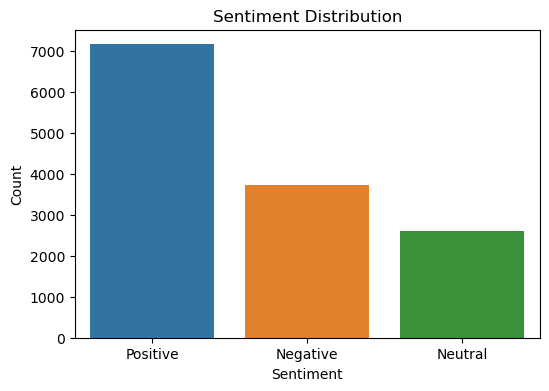

In [34]:
# Count by emotion category
sentiment_counts = Online_shopping_df['sentiment'].value_counts()

# Create a bar chart
plt.figure(figsize=(6, 4))
sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values)
plt.title("Sentiment Distribution")
plt.xlabel("Sentiment")
plt.ylabel("Count")
plt.show()

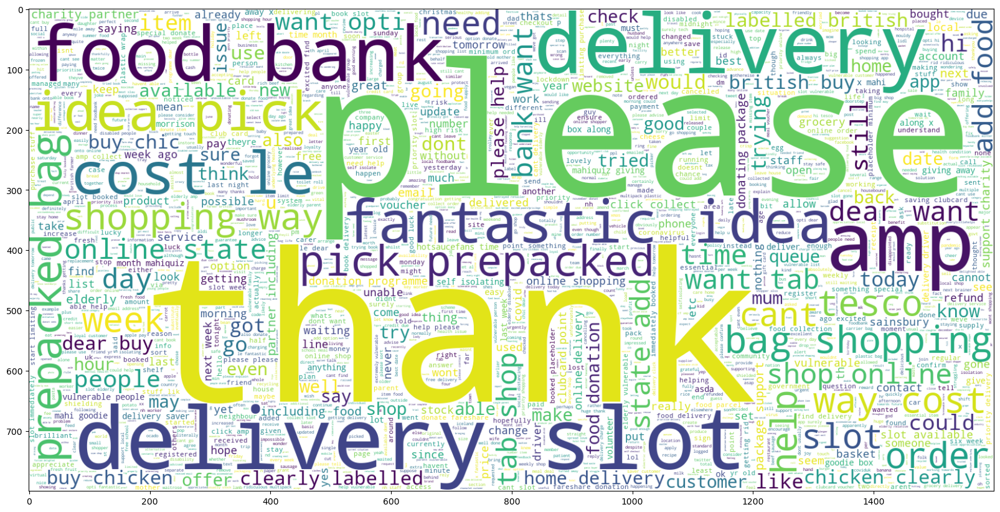

In [35]:
plt.figure(figsize=(20, 20)) 
wc = WordCloud(background_color='white', max_words=2000, width=1600, height=800, stopwords=stop_words)
wc.generate(" ".join(Online_shopping_df[Online_shopping_df.sentiment == 'Positive'].full_text))
plt.imshow(wc , interpolation = 'bilinear')  

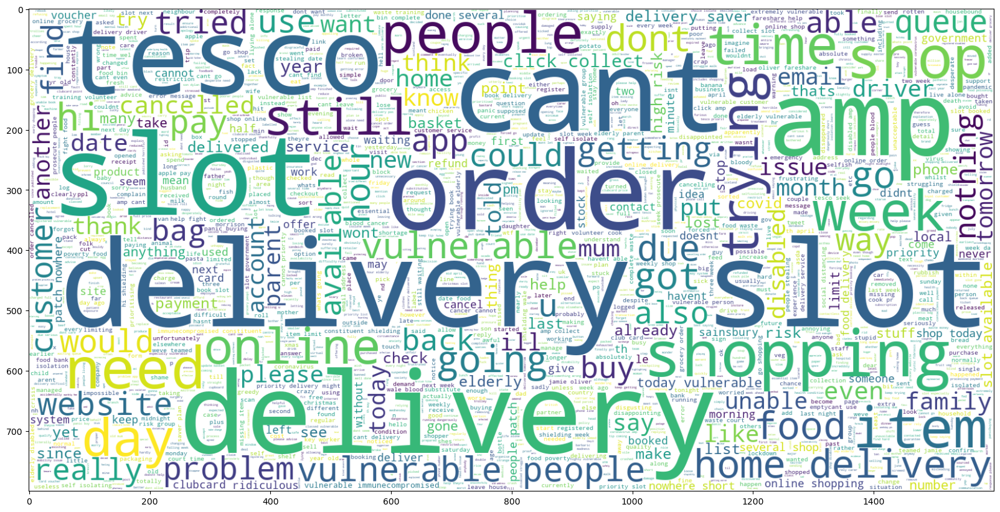

In [36]:
plt.figure(figsize=(20, 20)) 
wc = WordCloud(background_color='white', max_words=2000, width=1600, height=800, stopwords=stop_words)
wc.generate(" ".join(Online_shopping_df[Online_shopping_df.sentiment == 'Negative'].full_text))
plt.imshow(wc , interpolation = 'bilinear')   

### sentiment analysis for Packaging

In [37]:
Packaging_df = tesco_df[tesco_df['topic_name'] == 'Packaging']
Packaging_df.head(1)

,created_at,full_text,source,entities,lang,word_count,tokens,topic,topic_name
5,2020-07-07 17:01:36,today begin committe stage agriculture amp trade bill provision protect uk worldclass food amp animal welfar,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'thatginamiller', 'name': 'Gina Miller', 'id': 4105532853, 'id_str': '4105532853', 'indices': [3, 18]}], 'symbols': []}",en,16,"[today, begin, committe, stage, agriculture, amp, trade, bill, provision, protect, uk, worldclass, food, amp, animal, welfar]",6,Packaging


In [38]:
Packaging_df['vader_scores'] = Packaging_df['full_text'].apply(lambda text: sia.polarity_scores(text))

Packaging_df['compound'] = Packaging_df['vader_scores'].apply(lambda score: score['compound'])

def get_sentiment(compound_score):
    if compound_score > 0.05:
        return "Positive"
    elif compound_score < -0.05:
        return "Negative"
    else:
        return "Neutral"

Packaging_df['sentiment'] = Packaging_df['compound'].apply(get_sentiment)

Packaging_df.head(2)

,created_at,full_text,source,entities,lang,word_count,tokens,topic,topic_name,vader_scores,compound,sentiment
5,2020-07-07 17:01:36,today begin committe stage agriculture amp trade bill provision protect uk worldclass food amp animal welfar,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'thatginamiller', 'name': 'Gina Miller', 'id': 4105532853, 'id_str': '4105532853', 'indices': [3, 18]}], 'symbols': []}",en,16,"[today, begin, committe, stage, agriculture, amp, trade, bill, provision, protect, uk, worldclass, food, amp, animal, welfar]",6,Packaging,"{'neg': 0.0, 'neu': 0.852, 'pos': 0.148, 'compound': 0.3818}",0.3818,Positive
10,2020-03-09 18:03:21,someone posted pic tescos shelf emptied pasta,"<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'Kezgascoyne', 'name': 'Kerry Gascoyne', 'id': 773447550451998720, 'id_str': '773447550451998720', 'indices': [0, 12]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [13, 19]}], 'symbols': []}",en,7,"[someone, posted, pic, tescos, shelf, emptied, pasta]",6,Packaging,"{'neg': 0.221, 'neu': 0.779, 'pos': 0.0, 'compound': -0.1779}",-0.1779,Negative


In [39]:
packaging_sentiment_counts = Packaging_df['sentiment'].value_counts()
packaging_sentiment_counts

sentiment
Positive    1704
Negative     478
Neutral      414
Name: count, dtype: int64

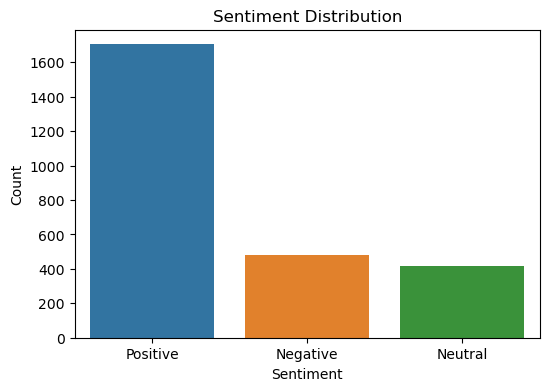

In [40]:
sentiment_counts = Packaging_df['sentiment'].value_counts()

plt.figure(figsize=(6, 4))
sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values)
plt.title("Sentiment Distribution")
plt.xlabel("Sentiment")
plt.ylabel("Count")
plt.show()


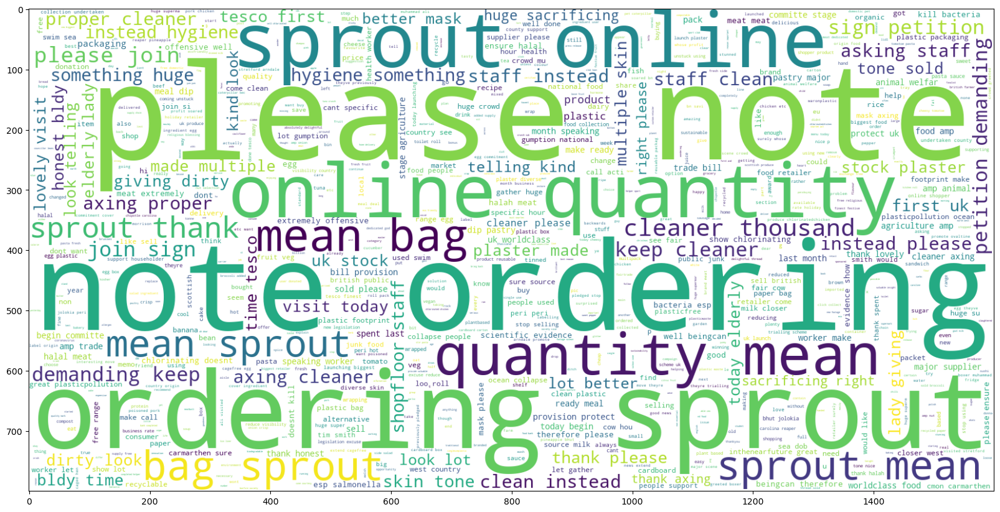

In [41]:
plt.figure(figsize=(20, 20)) 
wc = WordCloud(background_color='white', max_words=2000, width=1600, height=800, stopwords=stop_words)
wc.generate(" ".join(Packaging_df[Packaging_df.sentiment == 'Positive'].full_text))
plt.imshow(wc , interpolation = 'bilinear')  

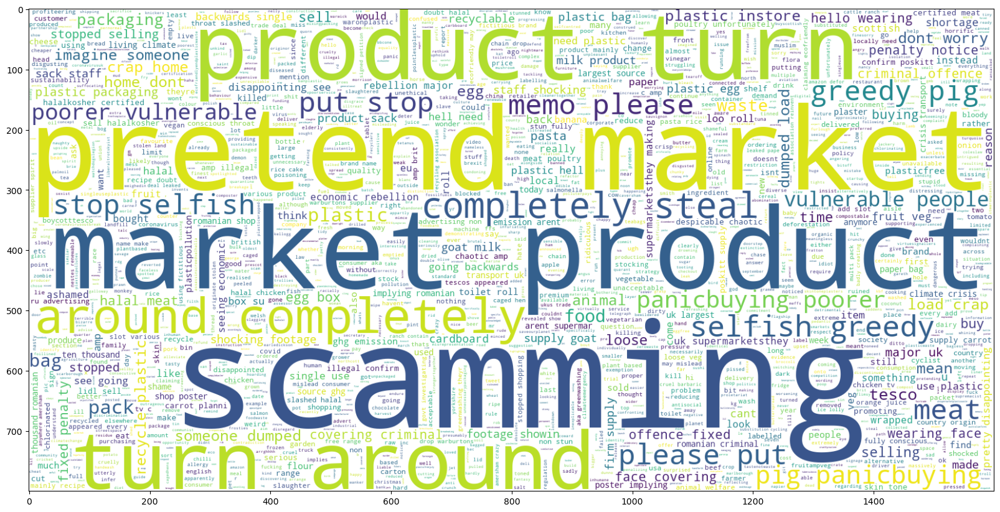

In [42]:
plt.figure(figsize=(20, 20)) 
wc = WordCloud(background_color='white', max_words=2000, width=1600, height=800, stopwords=stop_words)
wc.generate(" ".join(Packaging_df[Packaging_df.sentiment == 'Negative'].full_text))
plt.imshow(wc , interpolation = 'bilinear')   

### sentiment analysis for Customer_service

In [43]:
Customer_service_df = tesco_df[tesco_df['topic_name'] == 'Customer_service']
Customer_service_df.head(1)

,created_at,full_text,source,entities,lang,word_count,tokens,topic,topic_name
1,2020-12-22 11:34:32,comment british carrot proudly displaying union flag grown spain fraudulent,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [{'text': 'Fraudulent', 'indices': [87, 98]}], 'urls': [], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [12, 18]}], 'symbols': [], 'media': [{'id': 1341346375934611461, 'id_str': '1341346375934611461', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'url': 'https://t.co/miwKoWY6pc', 'display_url': 'pic.twitter.com/miwKoWY6pc', 'expanded_url': 'https://twitter.com/AndyEastAnglia/status/1341346379478740993/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'large': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'small': {'w': 382, 'h': 680, 'resize': 'fit'}}}]}",en,10,"[comment, british, carrot, proudly, displaying, union, flag, grown, spain, fraudulent]",8,Customer_service


In [44]:
Customer_service_df['vader_scores'] = Customer_service_df['full_text'].apply(lambda text: sia.polarity_scores(text))

Customer_service_df['compound'] = Customer_service_df['vader_scores'].apply(lambda score: score['compound'])

def get_sentiment(compound_score):
    if compound_score > 0.05:
        return "Positive"
    elif compound_score < -0.05:
        return "Negative"
    else:
        return "Neutral"

Customer_service_df['sentiment'] = Customer_service_df['compound'].apply(get_sentiment)

Customer_service_df.head(2)


,created_at,full_text,source,entities,lang,word_count,tokens,topic,topic_name,vader_scores,compound,sentiment
1,2020-12-22 11:34:32,comment british carrot proudly displaying union flag grown spain fraudulent,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [{'text': 'Fraudulent', 'indices': [87, 98]}], 'urls': [], 'user_mentions': [{'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [12, 18]}], 'symbols': [], 'media': [{'id': 1341346375934611461, 'id_str': '1341346375934611461', 'indices': [99, 122], 'media_url': 'http://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Ep1rbBJXEAUpOIZ.jpg', 'url': 'https://t.co/miwKoWY6pc', 'display_url': 'pic.twitter.com/miwKoWY6pc', 'expanded_url': 'https://twitter.com/AndyEastAnglia/status/1341346379478740993/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'large': {'w': 597, 'h': 1062, 'resize': 'fit'}, 'small': {'w': 382, 'h': 680, 'resize': 'fit'}}}]}",en,10,"[comment, british, carrot, proudly, displaying, union, flag, grown, spain, fraudulent]",8,Customer_service,"{'neg': 0.216, 'neu': 0.541, 'pos': 0.243, 'compound': 0.1027}",0.1027,Positive
2,2020-02-09 20:00:59,hard say racism isnt dead staff told showing id didnt feel comfortable sel,"<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'HardyCaprio', 'name': 'hardy caprio', 'id': 170423348, 'id_str': '170423348', 'indices': [3, 15]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [57, 63]}], 'symbols': []}",en,13,"[hard, say, racism, isnt, dead, staff, told, showing, id, didnt, feel, comfortable, sel]",8,Customer_service,"{'neg': 0.397, 'neu': 0.436, 'pos': 0.167, 'compound': -0.5803}",-0.5803,Negative


In [45]:
sentiment_counts = Customer_service_df['sentiment'].value_counts()
sentiment_counts

sentiment
Positive    19087
Negative     7716
Neutral      4452
Name: count, dtype: int64

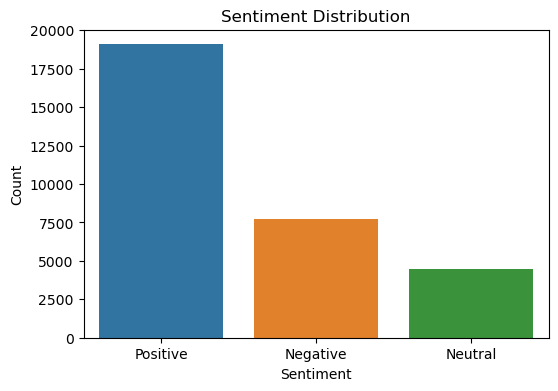

In [46]:
sentiment_counts = Customer_service_df['sentiment'].value_counts()

plt.figure(figsize=(6, 4))
sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values)
plt.title("Sentiment Distribution")
plt.xlabel("Sentiment")
plt.ylabel("Count")
plt.show()

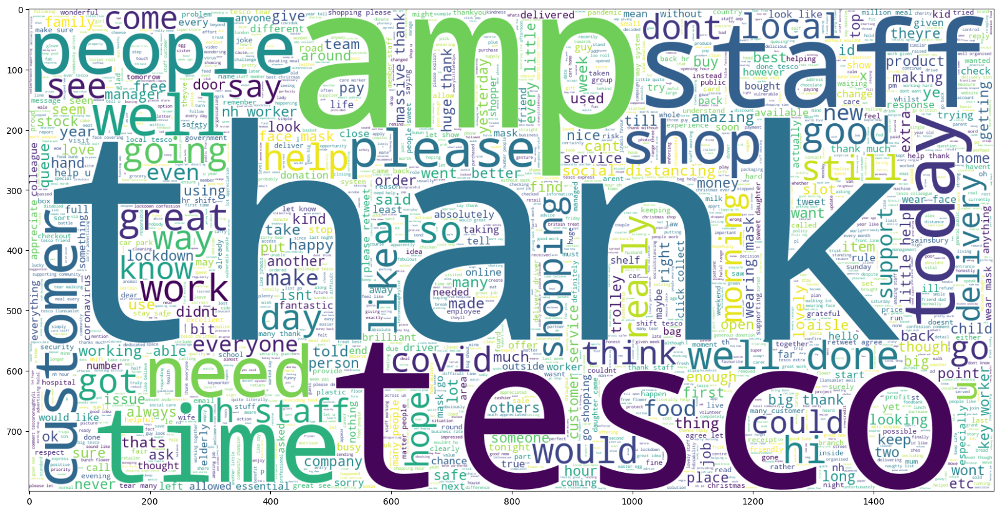

In [47]:
plt.figure(figsize=(20, 20)) 
wc = WordCloud(background_color='white', max_words=2000, width=1600, height=800, stopwords=stop_words)
wc.generate(" ".join(Customer_service_df[Customer_service_df.sentiment == 'Positive'].full_text))
plt.imshow(wc , interpolation = 'bilinear')  

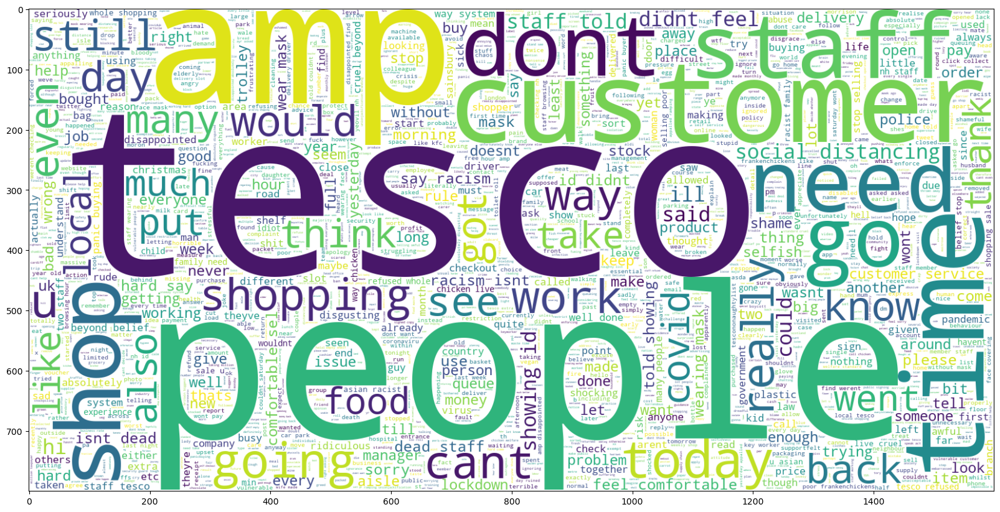

In [48]:
plt.figure(figsize=(20, 20)) 
wc = WordCloud(background_color='white', max_words=2000, width=1600, height=800, stopwords=stop_words)
wc.generate(" ".join(Customer_service_df[Customer_service_df.sentiment == 'Negative'].full_text))
plt.imshow(wc , interpolation = 'bilinear')   

### sentiment analysis for Food

In [49]:
Food_df = tesco_df[tesco_df['topic_name'] == 'Food']
Food_df.head(1)

,created_at,full_text,source,entities,lang,word_count,tokens,topic,topic_name
3,2020-06-09 12:47:00,weaning week award winner best retailer win gold win silver win joint bronze congratulation awardswinner weaningweekawards,"<a href=""https://about.twitter.com/products/tweetdeck"" rel=""nofollow"">TweetDeck</a>","{'hashtags': [], 'urls': [{'url': 'https://t.co/63oSiGtjiQ', 'expanded_url': 'https://twitter.com/i/web/status/1270336593421721600', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [112, 135]}], 'user_mentions': [{'screen_name': 'AmazonUK', 'name': 'Amazon.co.uk', 'id': 209004862, 'id_str': '209004862', 'indices': [56, 65]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [78, 84]}, {'screen_name': 'LidlGB', 'name': '@LidlGB', 'id': 340234449, 'id_str': '340234449', 'indices': [99, 106]}], 'symbols': []}",en,16,"[weaning, week, award, winner, best, retailer, win, gold, win, silver, win, joint, bronze, congratulation, awardswinner, weaningweekawards]",3,Food


In [50]:
Food_df['vader_scores'] = Food_df['full_text'].apply(lambda text: sia.polarity_scores(text))

Food_df['compound'] = Food_df['vader_scores'].apply(lambda score: score['compound'])

def get_sentiment(compound_score):
    if compound_score > 0.05:
        return "Positive"
    elif compound_score < -0.05:
        return "Negative"
    else:
        return "Neutral"

Food_df['sentiment'] = Food_df['compound'].apply(get_sentiment)

Food_df.head(2)


,created_at,full_text,source,entities,lang,word_count,tokens,topic,topic_name,vader_scores,compound,sentiment
3,2020-06-09 12:47:00,weaning week award winner best retailer win gold win silver win joint bronze congratulation awardswinner weaningweekawards,"<a href=""https://about.twitter.com/products/tweetdeck"" rel=""nofollow"">TweetDeck</a>","{'hashtags': [], 'urls': [{'url': 'https://t.co/63oSiGtjiQ', 'expanded_url': 'https://twitter.com/i/web/status/1270336593421721600', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [112, 135]}], 'user_mentions': [{'screen_name': 'AmazonUK', 'name': 'Amazon.co.uk', 'id': 209004862, 'id_str': '209004862', 'indices': [56, 65]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [78, 84]}, {'screen_name': 'LidlGB', 'name': '@LidlGB', 'id': 340234449, 'id_str': '340234449', 'indices': [99, 106]}], 'symbols': []}",en,16,"[weaning, week, award, winner, best, retailer, win, gold, win, silver, win, joint, bronze, congratulation, awardswinner, weaningweekawards]",3,Food,"{'neg': 0.0, 'neu': 0.251, 'pos': 0.749, 'compound': 0.9814}",0.9814,Positive
50,2020-06-25 14:09:25,cook favourite vegetable time broccoli unwrapping surprise fo,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'samd_official', 'name': 'Sam Darlaston', 'id': 532291818, 'id_str': '532291818', 'indices': [3, 17]}, {'screen_name': 'Tesco', 'name': 'Tesco', 'id': 271986064, 'id_str': '271986064', 'indices': [23, 29]}], 'symbols': []}",en,8,"[cook, favourite, vegetable, time, broccoli, unwrapping, surprise, fo]",3,Food,"{'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.2732}",0.2732,Positive


In [51]:
sentiment_counts = Food_df['sentiment'].value_counts()
sentiment_counts

sentiment
Positive    5372
Neutral     1016
Negative     243
Name: count, dtype: int64

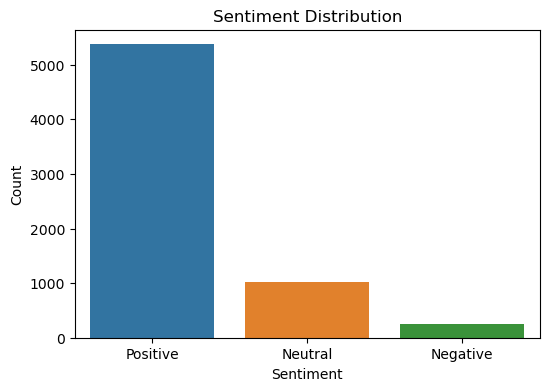

In [52]:
sentiment_counts = Food_df['sentiment'].value_counts()

plt.figure(figsize=(6, 4))
sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values)
plt.title("Sentiment Distribution")
plt.xlabel("Sentiment")
plt.ylabel("Count")
plt.show()

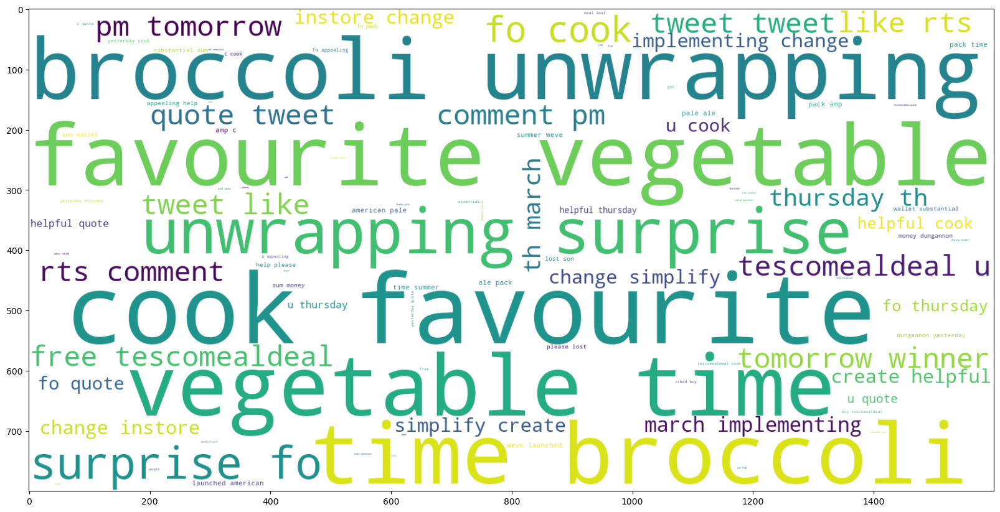

In [53]:
plt.figure(figsize=(20, 20)) 
wc = WordCloud(background_color='white', max_words=2000, width=1600, height=800, stopwords=stop_words)
wc.generate(" ".join(Food_df[Food_df.sentiment == 'Positive'].full_text))
plt.imshow(wc , interpolation = 'bilinear')  

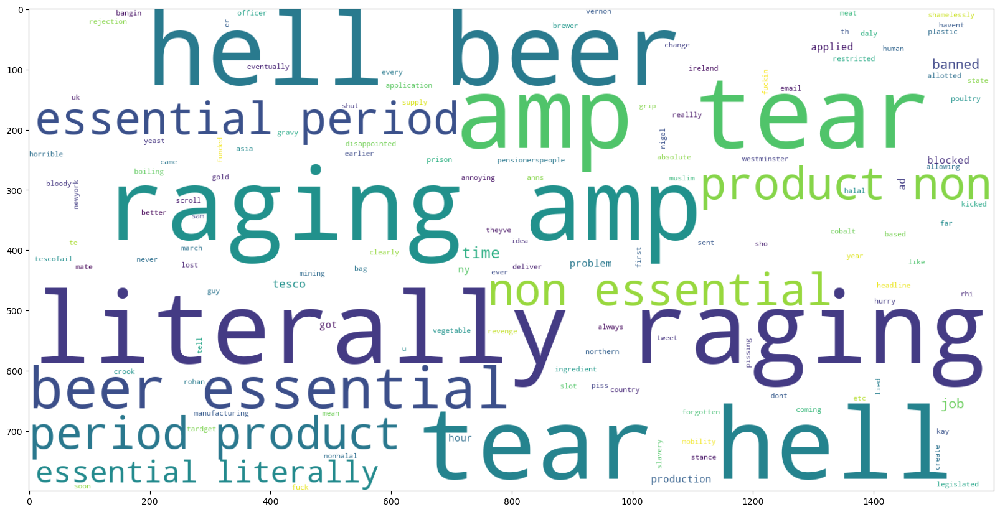

In [54]:
plt.figure(figsize=(20, 20)) 
wc = WordCloud(background_color='white', max_words=2000, width=1600, height=800, stopwords=stop_words)
wc.generate(" ".join(Food_df[Food_df.sentiment == 'Negative'].full_text))
plt.imshow(wc , interpolation = 'bilinear')   